In [4]:
import torch

# Load the two .pth files
conformer_model = torch.load("/home/biometrics/hrishikesh/idl_project/git_implementation/conformer/conformer/saved_models/conformer_epoch_5.pth")
locally_connected_model = torch.load("/home/biometrics/hrishikesh/idl_project/git_implementation/conformer/conformer/saved_locally_models/locally_connected_epoch_3.pth")

/tmp/ipykernel_3820295/2887534226.py:4: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  conformer_model = torch.load("/home/biometrics/hrishikesh/idl_project/git_implementatio

In [5]:
# Check for matching keys
keys_1 = set(conformer_model.keys())
keys_2 = set(locally_connected_model.keys())

if keys_1 != keys_2:
    print("The files have different keys!")
else:
    print("Both files have the same structure.")

The files have different keys!


/tmp/ipykernel_3820295/4015468372.py:5: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model_1 = torch.load("/home/biometrics/hrishikesh/idl_project/git_implementation/confor

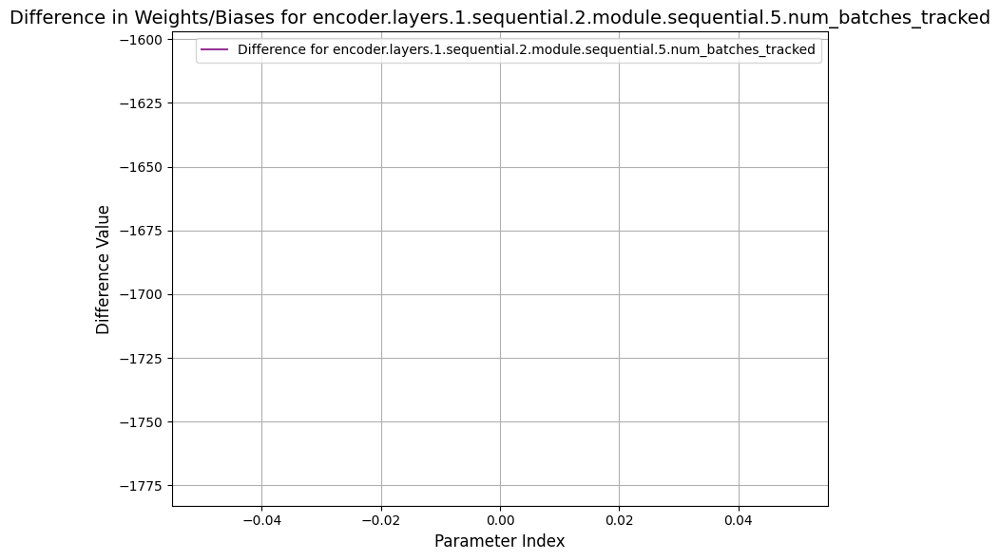

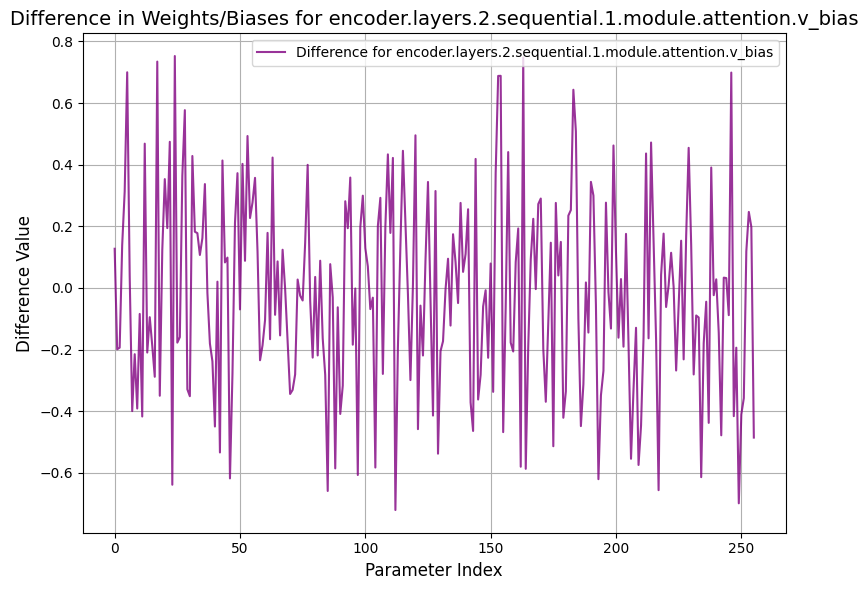

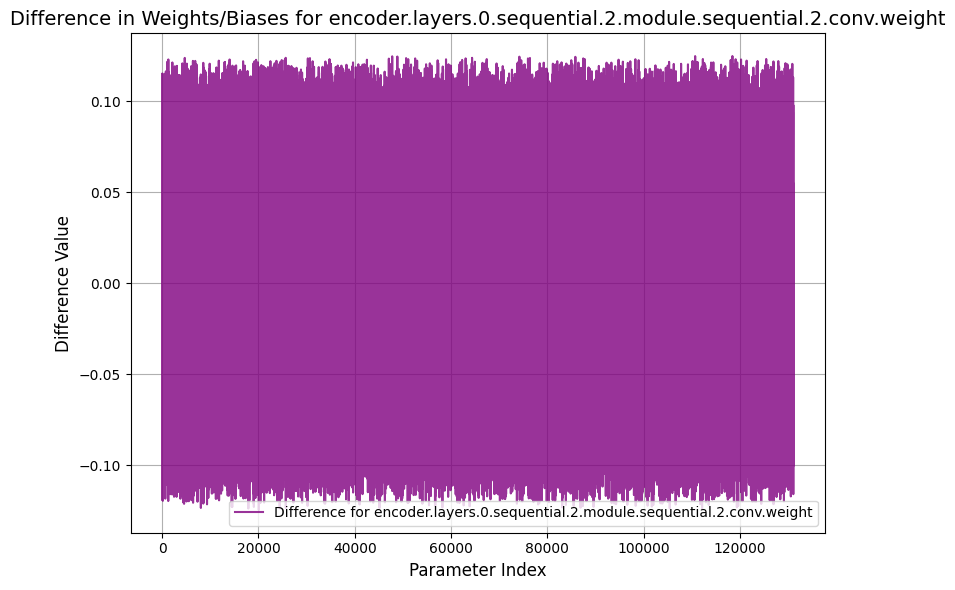

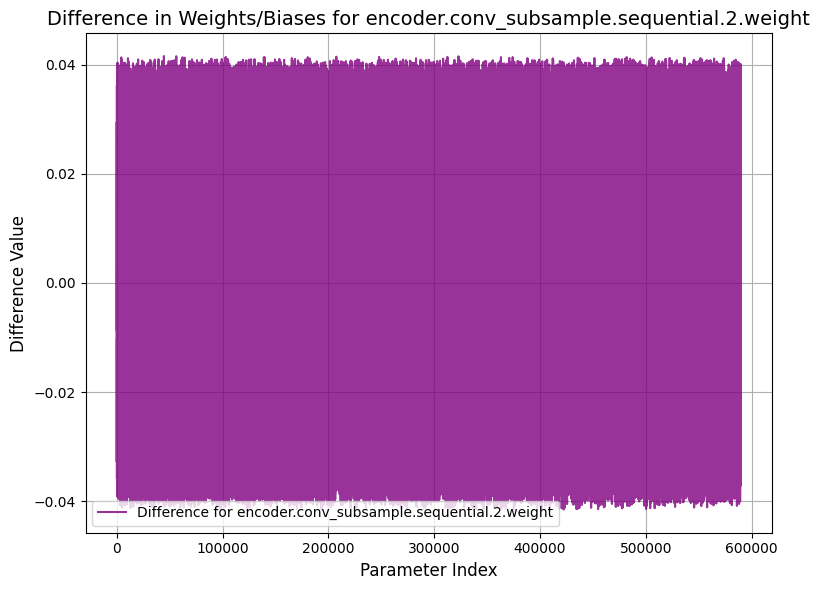

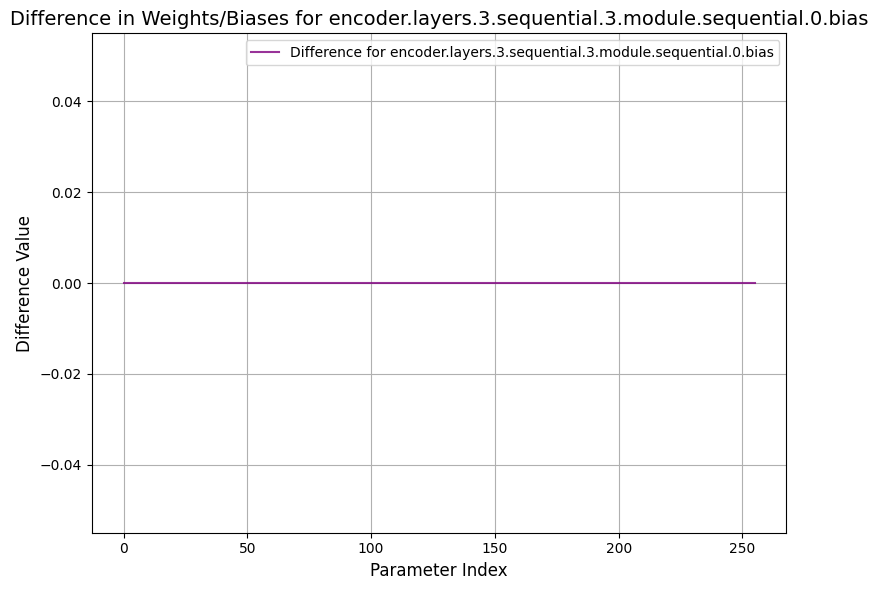

...

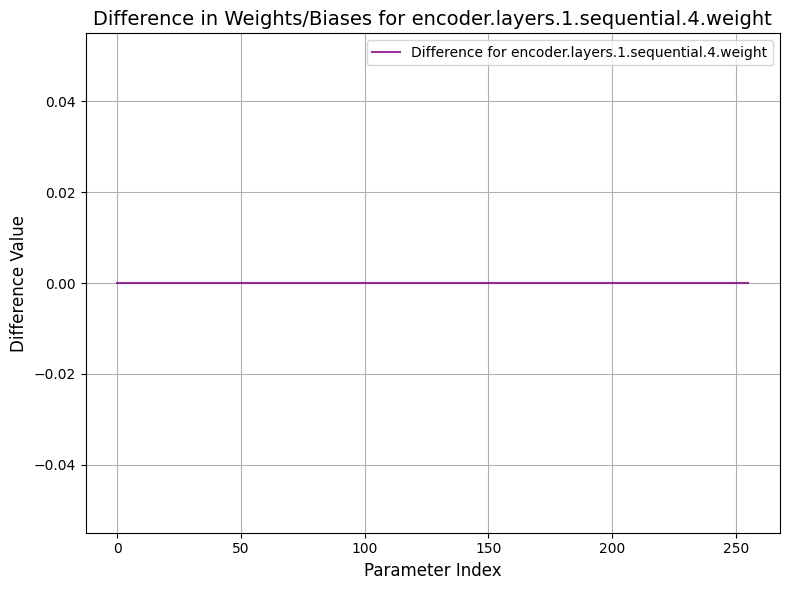

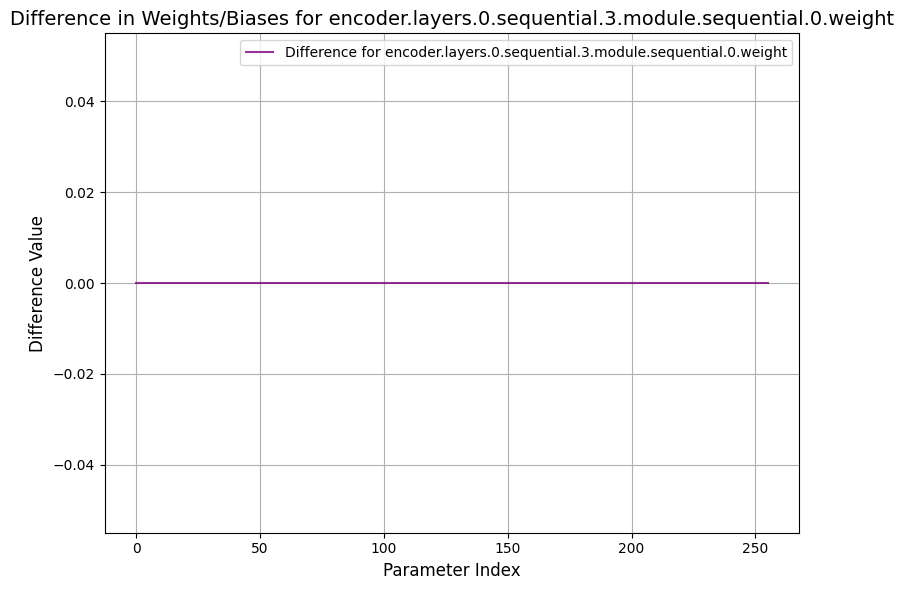

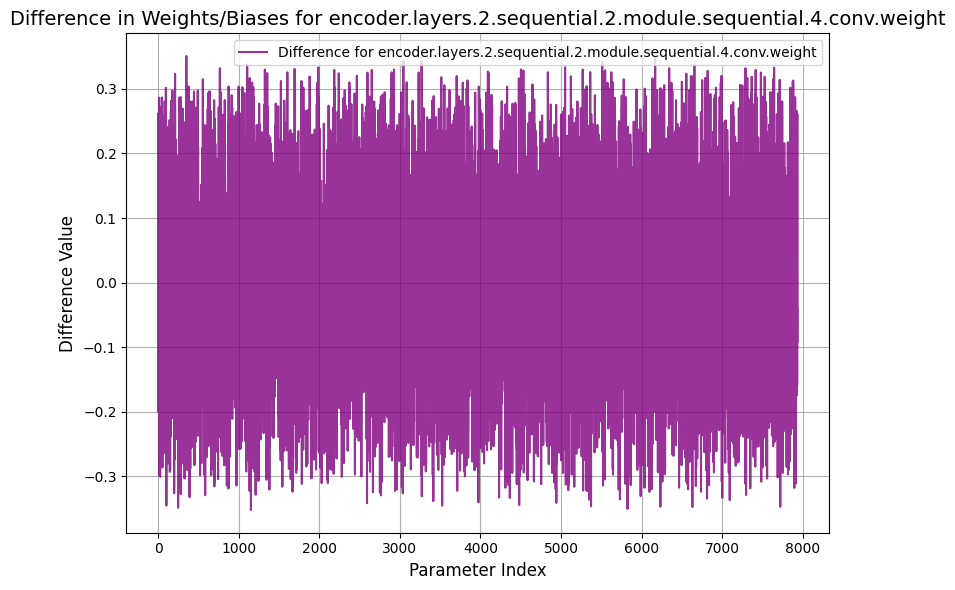

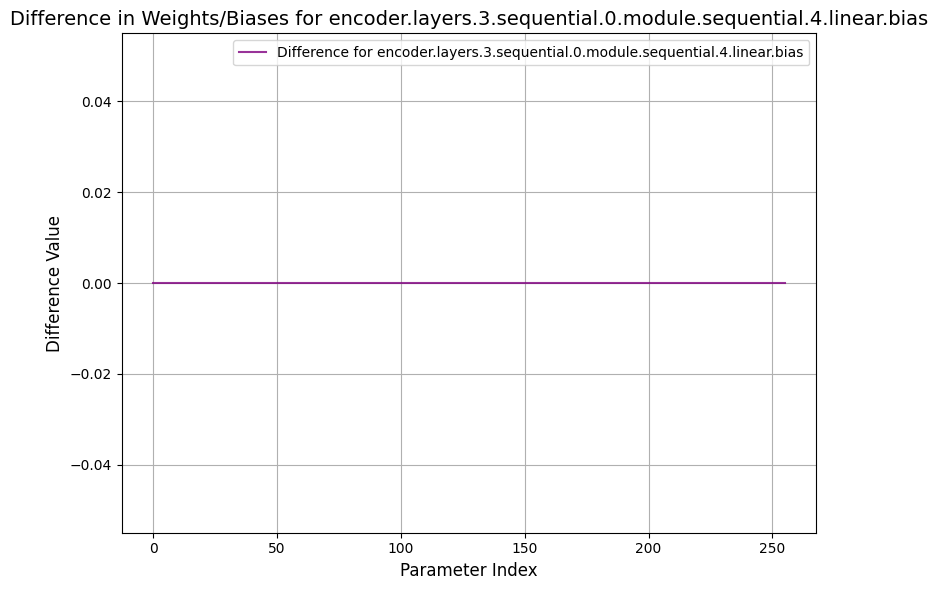

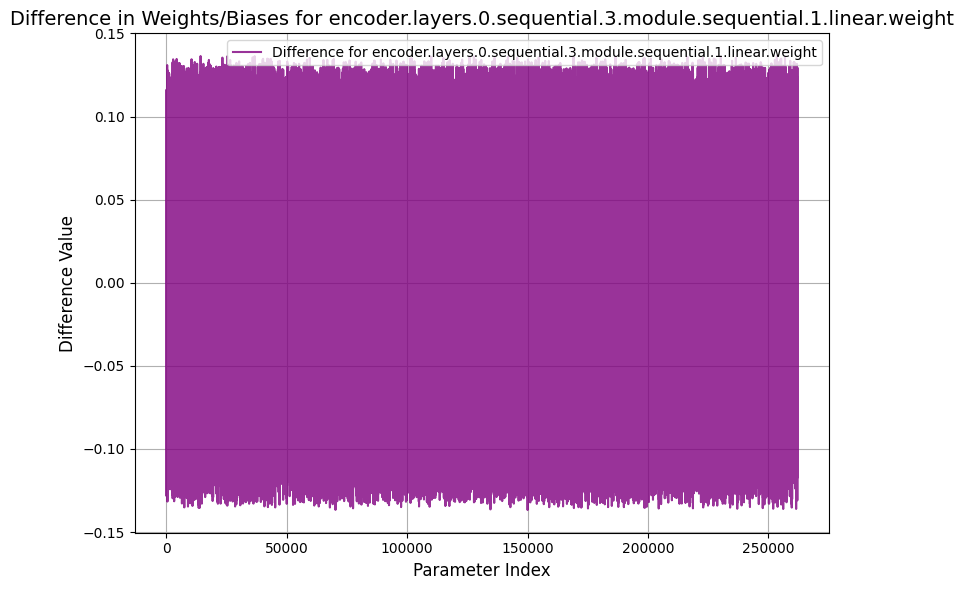

In [20]:
import torch
import matplotlib.pyplot as plt

# Load the models
model_1 = torch.load("/home/biometrics/hrishikesh/idl_project/git_implementation/conformer/conformer/saved_models/conformer_epoch_5.pth", map_location='cpu')
model_2 = torch.load("/home/biometrics/hrishikesh/idl_project/git_implementation/conformer/conformer/saved_locally_models/locally_connected_epoch_3.pth", map_location='cpu')

# Extract the state dictionaries
state_dict_1 = model_1['state_dict'] if 'state_dict' in model_1 else model_1
state_dict_2 = model_2['state_dict'] if 'state_dict' in model_2 else model_2

# Get the intersection of keys between the two models
shared_keys = set(state_dict_1.keys()).intersection(set(state_dict_2.keys()))

# Plot differences for each shared key
for key in shared_keys:
    data_1 = state_dict_1[key].numpy()
    data_2 = state_dict_2[key].numpy()
    
    # Ensure both tensors are of the same shape before calculating differences
    if data_1.shape == data_2.shape:
        diff = data_1 - data_2  # Calculate the difference
        
        plt.figure(figsize=(8, 6))
        plt.plot(diff.flatten(), label=f"Difference for {key}", color="purple", alpha=0.8)
        plt.title(f"Difference in Weights/Biases for {key}", fontsize=14)
        plt.xlabel("Parameter Index", fontsize=12)
        plt.ylabel("Difference Value", fontsize=12)
        plt.legend(fontsize=10)
        plt.grid()
        plt.tight_layout()
        plt.show()

In [6]:
print(keys_1)

{'encoder.layers.1.sequential.2.module.sequential.5.num_batches_tracked', 'encoder.layers.2.sequential.1.module.attention.v_bias', 'encoder.layers.0.sequential.2.module.sequential.2.conv.weight', 'encoder.conv_subsample.sequential.2.weight', 'encoder.layers.3.sequential.3.module.sequential.0.bias', 'encoder.layers.2.sequential.3.module.sequential.1.linear.bias', 'encoder.layers.0.sequential.2.module.sequential.0.bias', 'encoder.layers.3.sequential.2.module.sequential.0.bias', 'encoder.layers.1.sequential.2.module.sequential.4.conv.weight', 'encoder.layers.0.sequential.1.module.attention.key_proj.linear.bias', 'encoder.layers.2.sequential.2.module.sequential.7.conv.weight', 'encoder.layers.3.sequential.0.module.sequential.1.linear.bias', 'encoder.layers.2.sequential.0.module.sequential.1.linear.bias', 'encoder.layers.2.sequential.2.module.sequential.2.conv.weight', 'encoder.layers.3.sequential.2.module.sequential.2.conv.bias', 'encoder.layers.3.sequential.2.module.sequential.7.conv.weig

In [7]:
print(keys_2)

{'encoder.layers.1.sequential.2.module.sequential.5.num_batches_tracked', 'encoder.layers.2.sequential.1.module.attention.v_bias', 'encoder.layers.0.sequential.2.module.sequential.2.conv.weight', 'encoder.conv_subsample.sequential.2.weight', 'encoder.layers.3.sequential.3.module.sequential.0.bias', 'encoder.layers.2.sequential.3.module.sequential.1.linear.bias', 'encoder.layers.0.sequential.2.module.sequential.0.bias', 'encoder.layers.3.sequential.2.module.sequential.0.bias', 'encoder.layers.1.sequential.2.module.sequential.4.conv.weight', 'encoder.layers.0.sequential.1.module.attention.key_proj.linear.bias', 'encoder.layers.2.sequential.2.module.sequential.7.conv.weight', 'encoder.layers.3.sequential.0.module.sequential.1.linear.bias', 'encoder.layers.2.sequential.0.module.sequential.1.linear.bias', 'encoder.layers.2.sequential.2.module.sequential.2.conv.weight', 'encoder.layers.3.sequential.2.module.sequential.2.conv.bias', 'encoder.layers.3.sequential.2.module.sequential.7.conv.weig

In [8]:
keys_only_in_1 = keys_1 - keys_2
keys_only_in_2 = keys_2 - keys_1

print(f"Keys only in model 1:\n{keys_only_in_1}")
print(f"Keys only in model 2:\n{keys_only_in_2}")

Keys only in model 1:
set()
Keys only in model 2:
{'locally_connected_layer.bias', 'locally_connected_layer.weight'}


In [10]:
shared_keys = keys_1.intersection(keys_2)
print(f"Shared keys:\n{shared_keys}")

Shared keys:
{'encoder.layers.1.sequential.2.module.sequential.5.num_batches_tracked', 'encoder.layers.2.sequential.1.module.attention.v_bias', 'encoder.layers.0.sequential.2.module.sequential.2.conv.weight', 'encoder.conv_subsample.sequential.2.weight', 'encoder.layers.3.sequential.3.module.sequential.0.bias', 'encoder.layers.2.sequential.3.module.sequential.1.linear.bias', 'encoder.layers.0.sequential.2.module.sequential.0.bias', 'encoder.layers.3.sequential.2.module.sequential.0.bias', 'encoder.layers.1.sequential.2.module.sequential.4.conv.weight', 'encoder.layers.0.sequential.1.module.attention.key_proj.linear.bias', 'encoder.layers.2.sequential.2.module.sequential.7.conv.weight', 'encoder.layers.3.sequential.0.module.sequential.1.linear.bias', 'encoder.layers.2.sequential.0.module.sequential.1.linear.bias', 'encoder.layers.2.sequential.2.module.sequential.2.conv.weight', 'encoder.layers.3.sequential.2.module.sequential.2.conv.bias', 'encoder.layers.3.sequential.2.module.sequentia

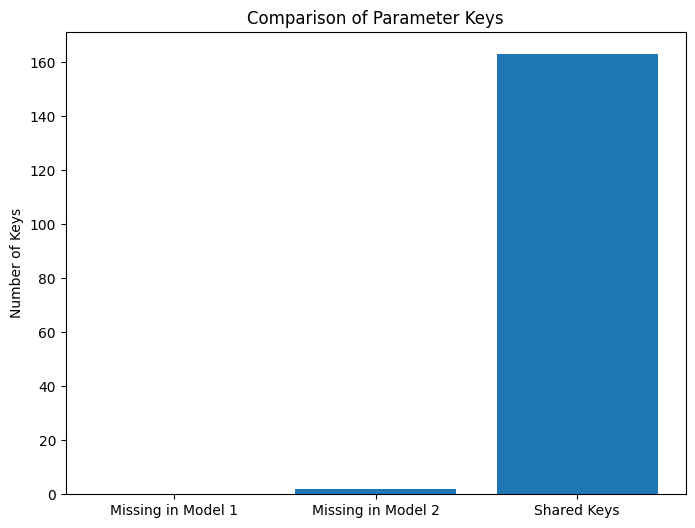

In [12]:
import matplotlib.pyplot as plt

# Plot the counts of missing vs shared keys
counts = [len(keys_only_in_1), len(keys_only_in_2), len(shared_keys)]
labels = ['Missing in Model 1', 'Missing in Model 2', 'Shared Keys']

plt.figure(figsize=(8, 6))
plt.bar(labels, counts)
plt.title("Comparison of Parameter Keys")
plt.ylabel("Number of Keys")
plt.show()

/tmp/ipykernel_3820295/3618218102.py:6: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model_1 = torch.load("/home/biometrics/hrishikesh/idl_project/git_implementation/confor

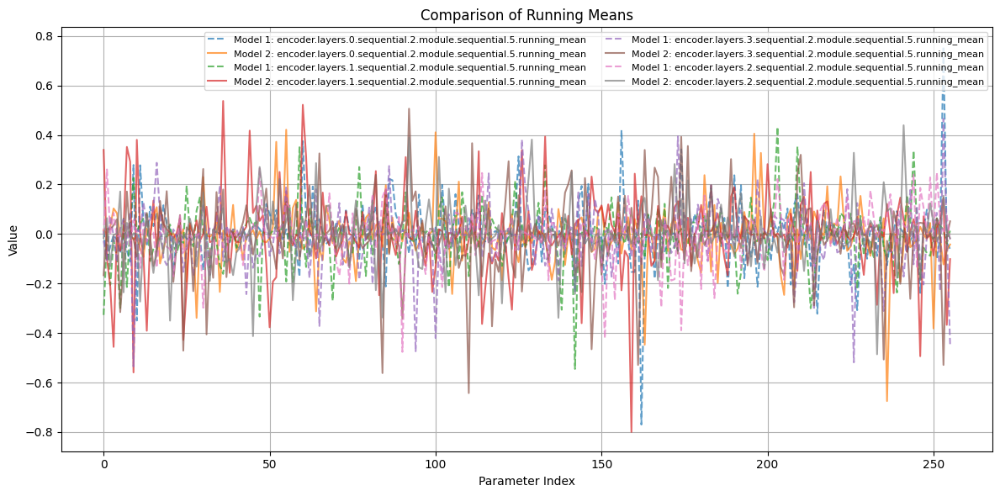

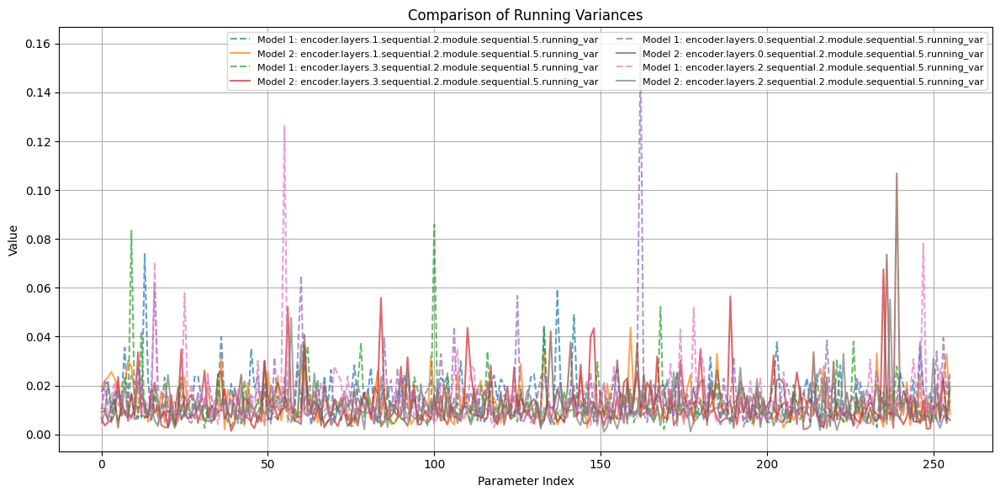

/tmp/ipykernel_3820295/3618218102.py:45: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


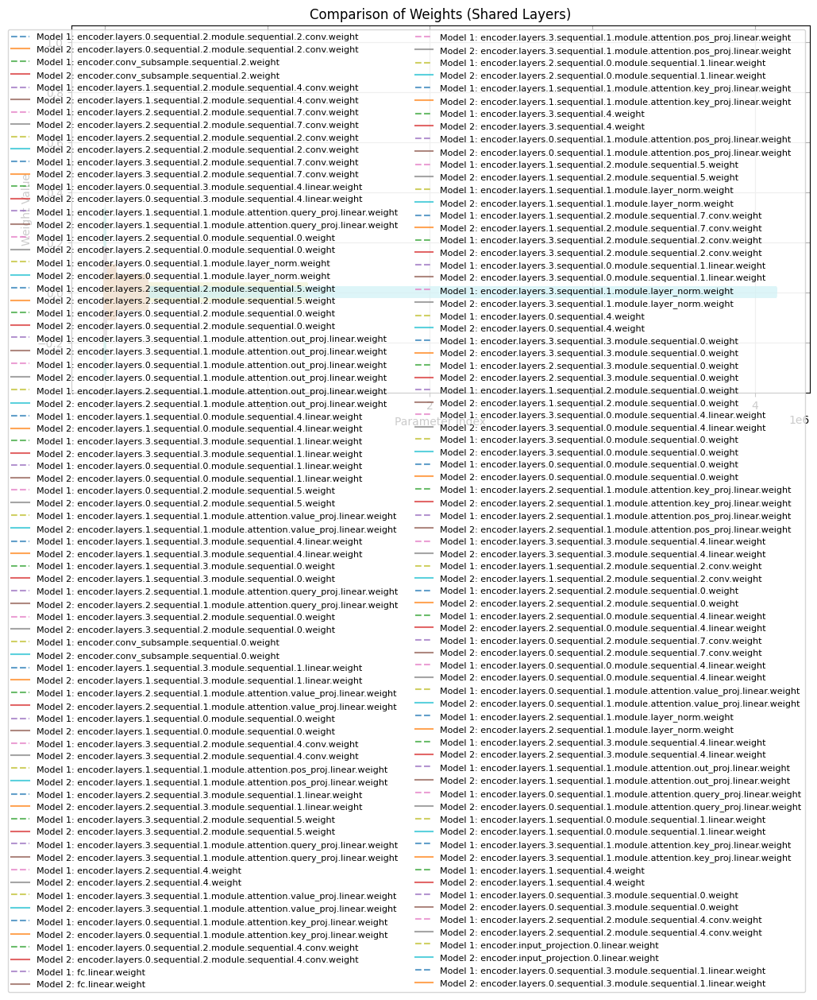

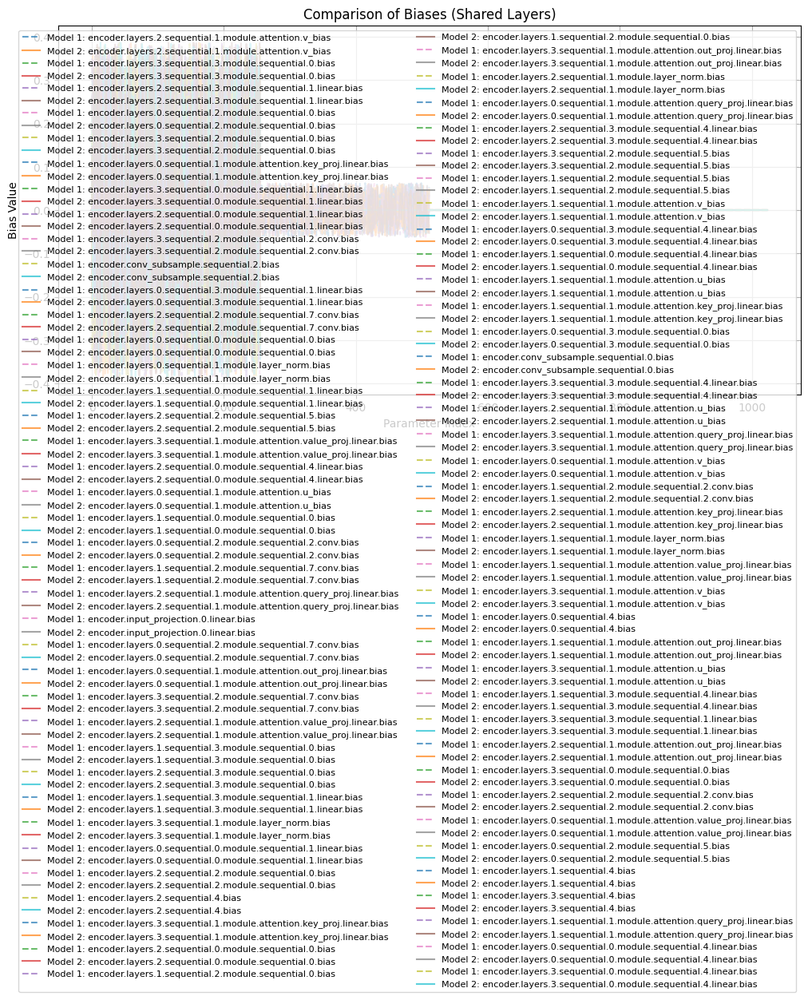

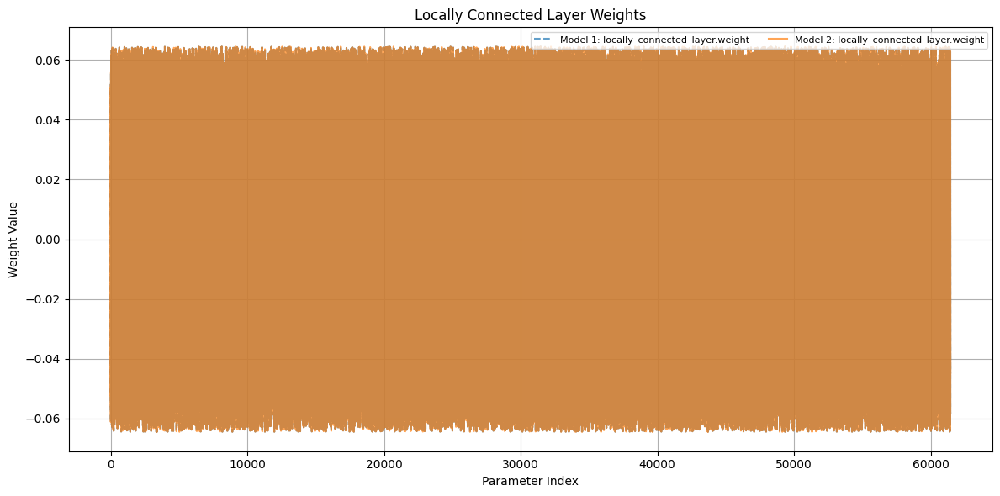

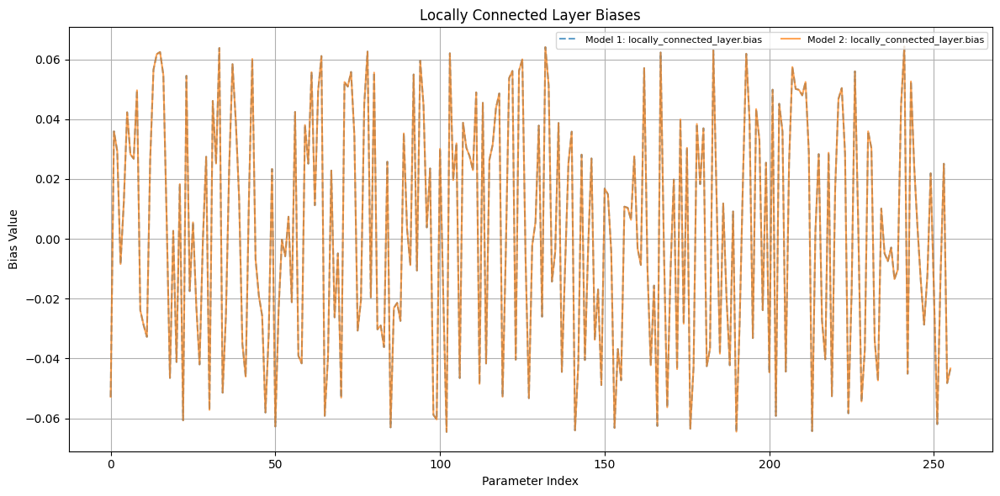

In [14]:
import torch
import matplotlib.pyplot as plt
import numpy as np

# Load models
model_1 = torch.load("/home/biometrics/hrishikesh/idl_project/git_implementation/conformer/conformer/saved_models/conformer_epoch_5.pth")
model_2 = torch.load("/home/biometrics/hrishikesh/idl_project/git_implementation/conformer/conformer/saved_locally_models/locally_connected_epoch_3.pth")

# Extract state_dicts
state_dict_1 = model_1['state_dict'] if 'state_dict' in model_1 else model_1
state_dict_2 = model_2['state_dict'] if 'state_dict' in model_2 else model_2

# Identify shared and unique keys
keys_1 = set(state_dict_1.keys())
keys_2 = set(state_dict_2.keys())
shared_keys = keys_1.intersection(keys_2)
unique_to_model_1 = keys_1 - keys_2
unique_to_model_2 = keys_2 - keys_1

# Categorize keys
def categorize_keys(keys):
    running_mean_keys = [key for key in keys if "running_mean" in key]
    running_var_keys = [key for key in keys if "running_var" in key]
    weight_keys = [key for key in keys if "weight" in key]
    bias_keys = [key for key in keys if "bias" in key]
    return running_mean_keys, running_var_keys, weight_keys, bias_keys

running_means_1, running_vars_1, weights_1, biases_1 = categorize_keys(shared_keys)
running_means_2, running_vars_2, weights_2, biases_2 = categorize_keys(unique_to_model_2)

# Helper function for plotting
def plot_comparison(keys, title, ylabel, filename, state_dict_1, state_dict_2):
    plt.figure(figsize=(12, 6))
    for key in keys:
        values_1 = state_dict_1[key].cpu().numpy().flatten()
        values_2 = state_dict_2[key].cpu().numpy().flatten()
        plt.plot(values_1, label=f"Model 1: {key}", linestyle='--', alpha=0.7)
        plt.plot(values_2, label=f"Model 2: {key}", alpha=0.7)

    plt.title(title)
    plt.xlabel("Parameter Index")
    plt.ylabel(ylabel)
    plt.legend(fontsize=8, loc='upper right', ncol=2)
    plt.grid()
    plt.tight_layout()
    plt.savefig(f"{filename}.png", dpi=300)
    plt.show()

# Plot Running Means
plot_comparison(running_means_1, "Comparison of Running Means", "Value", "running_means_comparison", state_dict_1, state_dict_2)

# Plot Running Variances
plot_comparison(running_vars_1, "Comparison of Running Variances", "Value", "running_variances_comparison", state_dict_1, state_dict_2)

# Plot Shared Weights
plot_comparison(weights_1, "Comparison of Weights (Shared Layers)", "Weight Value", "weights_comparison", state_dict_1, state_dict_2)

# Plot Biases (Shared Layers)
plot_comparison(biases_1, "Comparison of Biases (Shared Layers)", "Bias Value", "biases_comparison", state_dict_1, state_dict_2)

# Plot Unique Weights for Locally Connected Layer
if unique_to_model_2:
    locally_connected_weights = [key for key in unique_to_model_2 if "locally_connected_layer" in key and "weight" in key]
    locally_connected_biases = [key for key in unique_to_model_2 if "locally_connected_layer" in key and "bias" in key]

    if locally_connected_weights:
        plot_comparison(
            locally_connected_weights, 
            "Locally Connected Layer Weights", 
            "Weight Value", 
            "locally_connected_weights", 
            state_dict_2, 
            state_dict_2  # Compare only within model 2
        )

    if locally_connected_biases:
        plot_comparison(
            locally_connected_biases, 
            "Locally Connected Layer Biases", 
            "Bias Value", 
            "locally_connected_biases", 
            state_dict_2, 
            state_dict_2  # Compare only within model 2
        )

In [16]:
import torch
import matplotlib.pyplot as plt
import numpy as np

# Load models
model_1 = torch.load("/home/biometrics/hrishikesh/idl_project/git_implementation/conformer/conformer/saved_models/conformer_epoch_5.pth")
model_2 = torch.load("/home/biometrics/hrishikesh/idl_project/git_implementation/conformer/conformer/saved_locally_models/locally_connected_epoch_3.pth")

# Extract state_dicts
state_dict_1 = model_1['state_dict'] if 'state_dict' in model_1 else model_1
state_dict_2 = model_2['state_dict'] if 'state_dict' in model_2 else model_2

# Identify shared and unique keys
keys_1 = set(state_dict_1.keys())
keys_2 = set(state_dict_2.keys())
shared_keys = keys_1.intersection(keys_2)

# Categorize keys
def categorize_keys(keys):
    running_mean_keys = [key for key in keys if "running_mean" in key]
    running_var_keys = [key for key in keys if "running_var" in key]
    weight_keys = [key for key in keys if "weight" in key]
    bias_keys = [key for key in keys if "bias" in key]
    return running_mean_keys, running_var_keys, weight_keys, bias_keys

running_means, running_vars, weights, biases = categorize_keys(shared_keys)

# Optimized plot function
def plot_parameter_comparison(keys, title, ylabel, filename, state_dict_1, state_dict_2):
    """
    Plot parameter comparisons for a set of keys (fewer legends for speed).
    """
    plt.figure(figsize=(12, 6))
    for key in keys:
        values_1 = state_dict_1[key].cpu().numpy().flatten()
        values_2 = state_dict_2[key].cpu().numpy().flatten()
        plt.plot(values_1, alpha=0.7, linestyle='--', label=f"Model 1: {key}")
        plt.plot(values_2, alpha=0.7, label=f"Model 2: {key}")

    plt.title(title)
    plt.xlabel("Parameter Index")
    plt.ylabel(ylabel)
    plt.grid()
    plt.tight_layout()
    plt.savefig(f"{filename}.png", dpi=300)
    plt.close()  # Avoid rendering all plots in the notebook for speed

# Batch plotting to reduce runtime
def batch_plot(keys, batch_size, title, ylabel, filename_prefix, state_dict_1, state_dict_2):
    for i in range(0, len(keys), batch_size):
        batch_keys = keys[i:i+batch_size]
        batch_title = f"{title} (Batch {i // batch_size + 1})"
        batch_filename = f"{filename_prefix}_batch_{i // batch_size + 1}"
        plot_parameter_comparison(batch_keys, batch_title, ylabel, batch_filename, state_dict_1, state_dict_2)

# Plot in batches (adjust batch size for speed)
batch_size = 10
batch_plot(running_means, batch_size, "Running Means Comparison", "Value", "running_means", state_dict_1, state_dict_2)
batch_plot(running_vars, batch_size, "Running Variances Comparison", "Value", "running_variances", state_dict_1, state_dict_2)
batch_plot(weights, batch_size, "Weights Comparison", "Value", "weights", state_dict_1, state_dict_2)
batch_plot(biases, batch_size, "Biases Comparison", "Value", "biases", state_dict_1, state_dict_2)

/tmp/ipykernel_3820295/3466745533.py:6: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model_1 = torch.load("/home/biometrics/hrishikesh/idl_project/git_implementation/confor

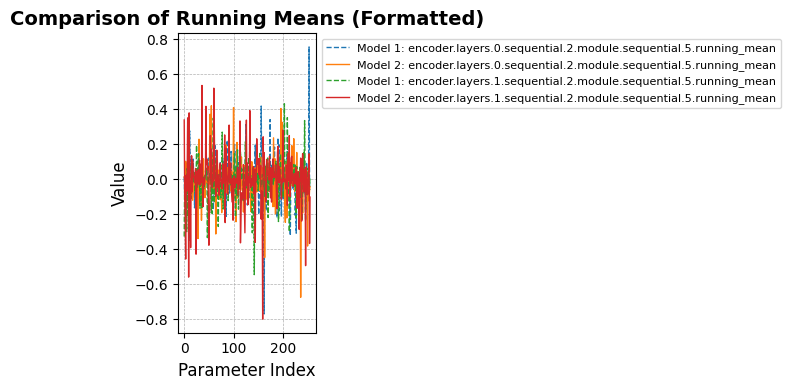

In [17]:
import matplotlib.pyplot as plt
import torch

# Function to format and save plots for papers
def format_plot_for_paper(keys, title, ylabel, filename, state_dict_1, state_dict_2):
    plt.figure(figsize=(7, 4))  # Adjust size for single-column layout
    for key in keys:
        values_1 = state_dict_1[key].cpu().numpy().flatten()
        values_2 = state_dict_2[key].cpu().numpy().flatten()
        plt.plot(values_1, label=f"Model 1: {key}", linestyle='--', linewidth=1.0)
        plt.plot(values_2, label=f"Model 2: {key}", linewidth=1.0)

    # Formatting
    plt.title(title, fontsize=14, fontweight="bold")
    plt.xlabel("Parameter Index", fontsize=12)
    plt.ylabel(ylabel, fontsize=12)
    plt.grid(which="both", linestyle="--", linewidth=0.5)
    plt.legend(fontsize=8, loc='upper left', bbox_to_anchor=(1, 1), ncol=1)  # External legend
    plt.tight_layout()
    plt.savefig(f"{filename}.pdf", dpi=300, bbox_inches='tight')  # Save as high-res PDF
    plt.show()

# Adjust plot calls
batch_size = 5  # To limit too many lines in a single plot
running_means = ["encoder.layers.0.sequential.2.module.sequential.5.running_mean", "encoder.layers.1.sequential.2.module.sequential.5.running_mean"]

format_plot_for_paper(
    running_means,
    "Comparison of Running Means (Formatted)",
    "Value",
    "running_means_paper",
    state_dict_1,
    state_dict_2
)